<a href="https://colab.research.google.com/github/ChrisMath26/Fisica-Computacional/blob/main/Algunas%20Simulaciones/Ejercicios.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- $Ejercicio$ $7.17$

Escriba un programa para generar grupos $DLA$ y calcular su dimensionalidad fractal. Aquí hay algunas sugerencias de programación para este problema. Ya hemos visto que los caminantes aleatorios pueden tardar mucho tiempo en moverse una distancia apreciable y esto puede hacer que la generación de un grupo $DLA$ sea muy lenta si no tiene cuidado. Inicialmente, comience a los nuevos caminantes a una distancia $r_{start}$ del origen, eligiendo la posición inicial de un caminante al azar en un círculo de radio $r_{start}$ (pero asegúrese de que estén en la red). Si el caminante se aleja demasiado del grupo, digamos más allá de 1,5 × $r_{start}$, es posible que nunca llegue al grupo, por lo que se debe iniciar un nuevo caminante. A medida que el grupo crece, se debe aumentar $r_{start}$ para que los caminantes no comiencen demasiado cerca del grupo. Intente mantener $r_{start}$ al menos 5 unidades más grande que el tamaño máximo del grupo (es decir, el punto en el grupo que está más alejado del origen). Además, cuando el caminante esté lejos del grupo, puedes dejarlo dar pasos de longitud 2 (para acelerar la caminata) y luego disminuir la longitud del paso a medida que se acerca al grupo.

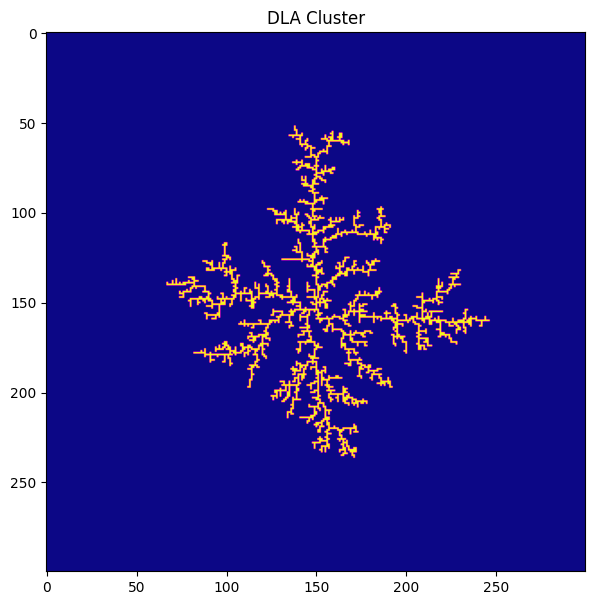

<ipython-input-2-5733562eb5c0>:106: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r" (-> color=(1.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(log_x, res.intercept + res.slope * log_x, 'r', color = 'lightblue', label=f'Ajuste Lineal: Dimensión Fractal = {res.slope:.3f}')


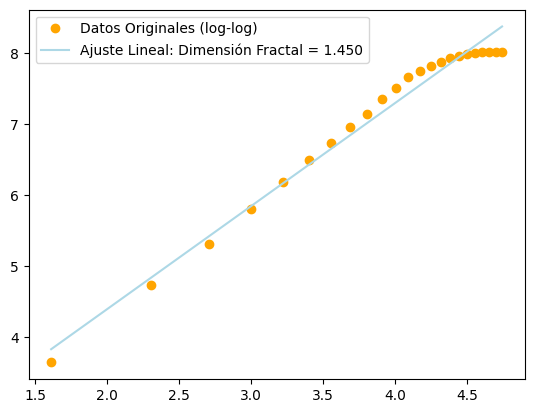

Dimensión fractal del clúster: 1.450


In [ ]:
#importar librerías
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib import animation
from IPython.display import HTML
import matplotlib.patches as patches
from matplotlib import colormaps
from scipy.stats import linregress
# Caminata aleatoria con paso variable
def paso_aleatorio(origen, Paso):
    num_al = np.random.randint(0, 4)
    x, y = origen
    if num_al == 0: return [x, y + Paso]  # Arriba
    if num_al == 1: return [x + Paso, y]  # Derecha
    if num_al == 2: return [x, y - Paso]  # Abajo
    if num_al == 3: return [x - Paso, y]  # Izquierda

def posicion_particula(radio, dx):
    theta = np.random.rand() * 2 * np.pi
    x = int(radio* np.cos(theta)) + dx
    y = int(radio* np.sin(theta)) + dx
    return [x, y]

# Generación del clúster DLA
def generar_cluster_DLA(N, T):
    Matriz = np.zeros([N, N])
    dx = N // 2
    Matriz[dx, dx] = 1  # Semilla inicial en el centro

    t = 0
    radio = 8

    while t < T:
        control = True
        x, y = posicion_particula(radio, dx)

        while control:
            # Calcular distancia del caminante al origen
            distancia = np.sqrt((x - dx) ** 2 + (y - dx) ** 2)

            # Si se aleja demasiado, reiniciar el caminante
            if distancia >= 1.5 * radio:
                control = False

            # Ajustar la velocidad del caminante
            velocidad = 2 if distancia >= 5 * radio else 1

            # Movimiento aleatorio
            x, y = paso_aleatorio([x, y], velocidad)
            x = max(min(x, N - 1), 0)
            y = max(min(y, N - 1), 0)

            # Verificar si el caminante está cerca del clúster
            detenerse = (Matriz[min(x + 1, N - 1), y] or
                         Matriz[x, max(y - 1, 0)] or
                         Matriz[x, min(y + 1, N - 1)] or
                         Matriz[max(x - 1, 0), y]) == 1

            # Si está cerca, detenerse y agregar al clúster
            if detenerse:
                Matriz[x, y] = 1
                control = False
                radio = max(radio, distancia + 5)
                t += 1

    return Matriz, dx
N = 300
T = 3000
Matriz, dx = generar_cluster_DLA(N, T)


# Gráfica del clúster DLA
plt.figure(figsize=(7, 7))
plt.title('DLA Cluster')
plt.imshow(Matriz, cmap='plasma')
plt.show()


# Conteo de puntos en el radio para calcular dimensión fractal
def conteo_puntos_rad(Matriz, N, dx):
    radios = np.arange(5, 120, 5)
    area = []

    for radio in radios:
        cont = 0
        for i in range(N):
            for j in range(N):
                distancia = np.sqrt((i - dx)**2 + (j - dx)**2)
                if distancia <= radio and Matriz[i, j] == 1:
                    cont += 1
        area.append(cont)

    return radios, area
# Cálculo de la dimensión fractal
#la pendiente de un gráfico log-log es igual a la dimensionalidad fractal.
x, y = conteo_puntos_rad(Matriz, N, dx)
log_x = np.log(x)
log_y = np.log(y)

# Ajuste lineal log-log para la dimensión fractal
res = linregress(log_x, log_y)


plt.plot(log_x, log_y, 'o', color= 'orange', label='Datos Originales (log-log)')
plt.plot(log_x, res.intercept + res.slope * log_x, 'r', color = 'lightblue', label=f'Ajuste Lineal: Dimensión Fractal = {res.slope:.3f}')
plt.legend()
plt.show()

print(f'Dimensión fractal del clúster: {res.slope:.3f}')

- $Ejercicio$ $7.18$

Haz crecer un clúster $DLA$ utilizando el algoritmo descrito en el problema anterior, pero en lugar de permitir que los caminantes comiencen desde puntos en un círculo que rodea el clúster, haz que todos los caminantes comiencen en una ubicación en el eje
$x$. ¿Cómo afecta esto la forma y la estructura del clúster?

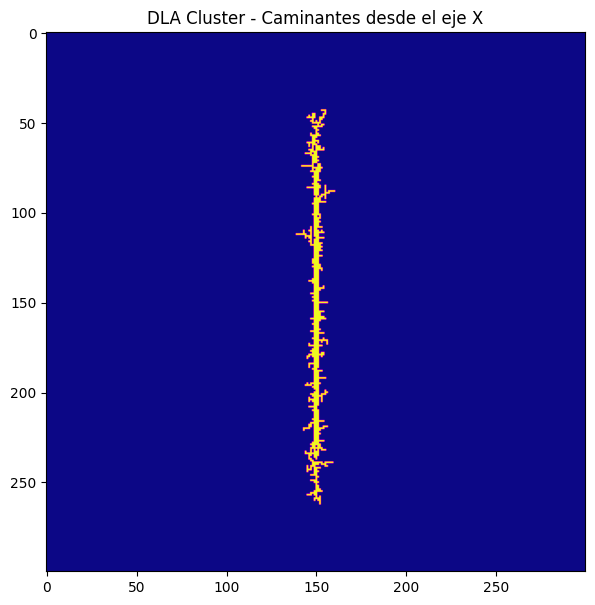

In [ ]:
def paso_aleatorio(origen, Paso):
    num_al = np.random.randint(0, 4)
    x, y = origen
    if num_al == 0: return [x, y + Paso]  # Arriba
    if num_al == 1: return [x + Paso, y]  # Derecha
    if num_al == 2: return [x, y - Paso]  # Abajo
    if num_al == 3: return [x - Paso, y]  # Izquierda

# Posición inicial de la partícula en el eje x
def posicion_particula_en_eje_x(N, dx):
    x = np.random.randint(0, N)
    y = dx
    return [x, y]

# Generación del clúster DLA con caminantes comenzando en el eje x
def generar_cluster_DLA_en_eje_x(N, T):
    Matriz = np.zeros([N, N])
    dx = N // 2
    Matriz[dx, dx] = 1  # Semilla inicial en el centro

    t = 0
    radio = 8

    while t < T:
        control = True
        x, y = posicion_particula_en_eje_x(N, dx)

        while control:
            # Calcular distancia del caminante al origen
            distancia = np.sqrt((x - dx) ** 2 + (y - dx) ** 2)

            # Si se aleja demasiado, reiniciar el caminante
            if distancia >= 1.5 * radio:
                control = False

            # Ajustar la velocidad del caminante
            velocidad = 2 if distancia >= 5 * radio else 1

            # Movimiento aleatorio
            x, y = paso_aleatorio([x, y], velocidad)
            x = max(min(x, N - 1), 0)
            y = max(min(y, N - 1), 0)

            # Verificar si el caminante está cerca del clúster
            detenerse = (Matriz[min(x + 1, N - 1), y] or
                         Matriz[x, max(y - 1, 0)] or
                         Matriz[x, min(y + 1, N - 1)] or
                         Matriz[max(x - 1, 0), y]) == 1

            # Si está cerca, detenerse y agregar al clúster
            if detenerse:
                Matriz[x, y] = 1
                control = False
                radio = max(radio, distancia + 5)
                t += 1

    return Matriz, dx


N = 300
T = 3000
Matriz_eje_x, dx = generar_cluster_DLA_en_eje_x(N, T)
plt.figure(figsize=(7, 7))
plt.title('DLA Cluster - Caminantes desde el eje X')
plt.imshow(Matriz_eje_x, cmap='plasma')
plt.show()


- $Ejercicio$ $7.19$ \
Genera una estructura $DLA$ utilizando una "semilla" inicial, que es todo el eje $x$. Es decir, comienza con todos los sitios en el eje $x$ ocupados y deja que los caminantes comiencen a una cierta distancia por encima de este eje. La estructura resultante a veces se utiliza para modelar los caminos seguidos por descargas eléctricas en un gas (es decir, rayos).

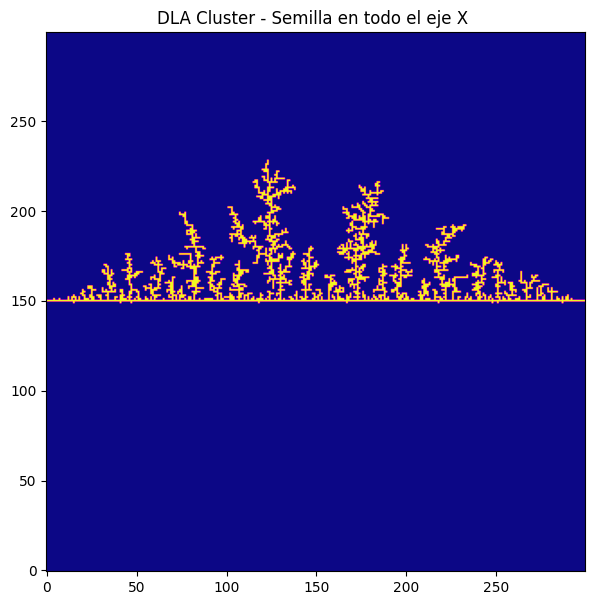

In [ ]:
# Posición inicial de la partícula con radio y dispersión
def semilla(radio, dx, N):
    y = np.random.randint(low=-radio, high=radio) + dx
    x = np.random.randint(low=0, high=N//2) + dx
    return [int(x), int(y)]

# Generación del clúster DLA con semilla en el eje x
def generar_cluster_DLA_mejorado(N, T, radio):
    Matriz = np.zeros([N, N])
    dx = N // 2
    # Semilla inicial: todo el eje x está ocupado
    Matriz[dx, :] = 1

    t = 0
    radio = 8

    while t < T:
        control = True
        x, y = semilla(radio, dx, N)

        while control:
            # Calcular distancia del caminante al centro
            distancia = np.sqrt((x - dx) ** 2 + (y - dx) ** 2)

            # Condiciones de parada basadas en la distancia y radio
            if distancia >= 1.5 * radio or distancia >= (dx - 10):
                control = False

            # Velocidad ajustada según la distancia
            velocidad = 2 if distancia >= 1.09 * radio else 1

            # Movimiento aleatorio
            x, y = paso_aleatorio([x, y], velocidad)
            x = max(min(x, N - 1), 0)
            y = max(min(y, N - 1), 0)

            # Comprobar si está cerca del clúster y detenerse

            detenerse = (Matriz[min(x + 1, N - 1), y] or
                             Matriz[x, max(y - 1, 0)] or
                             Matriz[x, min(y + 1, N - 1)] or
                             Matriz[max(x - 1, 0), y]) == 1

            if detenerse:
                Matriz[x, y] = 1
                control = False
                radio = max(radio, distancia + 5)
                t += 1

    return Matriz, dx

# Parámetros
N = 300
T = 3000
radio = 8
Matriz_mejorada, dx = generar_cluster_DLA_mejorado(N, T, radio)
plt.figure(figsize=(7, 7))
plt.title('DLA Cluster - Semilla en todo el eje X ')
plt.imshow(Matriz_mejorada, origin='lower', cmap='plasma')
plt.show()

## Ejercicio 2

El modelo de Schelling es un modelo popular utilizado para entender la segregación de grupos raciales o de grupos con diferentes estatus económicos etc...

El modelo considera dos tipos de agentes, digamos azules (B) y rojos (R), que podrían representar diferentes razas, etnias, estatus económico, etc., y una cuadrícula $N \times N$ de ubicaciones residenciales sobre la cual se asigna inicialmente un número $N_a \leq N^2$ de agentes de manera aleatoria. La población de agentes se caracteriza por la fracción $B/R$ de tipos azules a rojos, de modo que $N_a = B + R$, y se asume constante, de manera que en cualquier momento dado se tendrá $N_v = N^2 - N_a$ ubicaciones residenciales vacantes. Luego, cada agente $i$ se caracteriza por un parámetro de satisfacción $S_i$ dado por la fracción de vecinos del mismo tipo.

La dinámica está determinada por un parámetro de tolerancia global $\tau$, que indica la fracción máxima de vecinos de un tipo diferente que cada agente está dispuesto a aceptar antes de decidir mudarse. Por lo tanto, cada agente con $S_i < 1−\tau$ se mudará aleatoriamente a una ubicación residencial vacante diferente. La dinámica continúa hasta encontrar un equilibrio estable (si existe), donde todos los agentes están satisfechos.

Como consecuencia, las decisiones individuales se basan exclusivamente en consideraciones personales relacionadas con las características del vecindario local en el que actualmente residen. Sin embargo, el acto de mudarse, a pesar de basarse en parámetros locales, acaba teniendo un efecto global, ya que la reubicación aleatoria de un agente puede causar insatisfacción en otros agentes que antes estaban satisfechos.

Considere una rejilla de $N\times N$ con $N = 60$, donde el $10\%$ de las celdas está desocupado en cualquier instante de tiempo. Asuma una población inicial con igual número de personas Azules y de personas Rojas. Realice varias simulaciones con parámetros de tolerancia $\tau \in [0.2, 0.8]$. Anime la simulación y muestre diferentes escenarios que emergen para los diferentes valores de $\tau$. Considere para este ejercicio condiciones de frontera periódicas y un vecindario de Moore (8 celdas adyacentes).

In [ ]:
#Librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, colors
from IPython.display import HTML
import random
def contar_vecinos(rejilla, i, j, N):
    # posiciones 8 vecinos (celdas) adyacentes
    vecinos = [(i-1,j), (i+1,j), (i,j-1), (i,j+1), (i-1,j-1), (i-1,j+1), (i+1,j-1), (i+1,j+1)]
    #condiciones de frontera periódicas
    vecinos = [(x % N, y % N) for x, y in vecinos]
    mismo_color = 0
    otro_color = 0
    for x, y in vecinos:
        if rejilla[x, y] == rejilla[i, j]:
            mismo_color += 1
        elif rejilla[x, y] != 1:  # Cualquier vecino no vacío de otro color
            otro_color += 1
    return mismo_color, otro_color
def Schelling_reglas(rejilla, tau, i, j, N):
    mismo_color, otro_color = contar_vecinos(rejilla, i, j, N)
    # en caso de no tener vecinos
    if mismo_color + otro_color == 0:
        return False
    #  satisfacción basada en la proporción de vecinos del mismo color
    satisfaccion = mismo_color / (mismo_color + otro_color)
    return satisfaccion < 1 - tau

def graficar(i, vector_a, tiempos, ax, linea):
    linea.set_array(vector_a[i])
    ax.set_title(f"Simulación del Modelo de Segregación de Schelling")

def animacion_similaridad(tau, N=60, max_etapa=300):
    libres = N**2 // 10  # 10% de celdas vacías
    rejilla = np.ones((N, N)) * 1  # Inicializa todas las celdas como vacías

    # Asigna colores a los agentes de manera aleatoria
    r = np.random.choice(N**2, int(N**2 - libres), replace=False)
    for k, pos in enumerate(r):
        h = np.unravel_index(pos, (N, N))
        rejilla[h] = 0 if k < (N**2 - libres) / 2 else 2  # Rojos y Azules alternados

    fig, ax = plt.subplots()
    linea = ax.imshow(rejilla, cmap='bwr', origin="lower")

    desocupadas = list(zip(*np.where(rejilla == 1)))
    vector_instancias = [np.copy(rejilla)]

    for t in range(max_etapa):
        # Proceso de simulación en cada etapa
        for i in range(N):
            for j in range(N):
                if rejilla[i, j] != 1 and Schelling_reglas(rejilla, tau, i, j, N):
                    color = rejilla[i, j]
                    rejilla[i, j] = 1
                    nueva_pos = random.choice(desocupadas)
                    rejilla[nueva_pos] = color
                    desocupadas.remove(nueva_pos)
                    desocupadas.append((i, j))
        vector_instancias.append(np.copy(rejilla))
        if np.array_equal(vector_instancias[-1], vector_instancias[-2]):
            break  # Termina la simulación si no hay cambios

    anim = animation.FuncAnimation(fig, lambda i, vector_a, tiempos, ax, linea: graficar(i, vector_a, tiempos, ax, linea), frames=len(vector_instancias), interval=300, fargs=(vector_instancias, np.arange(len(vector_instancias)), ax, linea))
    plt.colorbar(linea)
    return HTML(anim.to_jshtml())
tau= np.linspace(0.2,0.8,5)

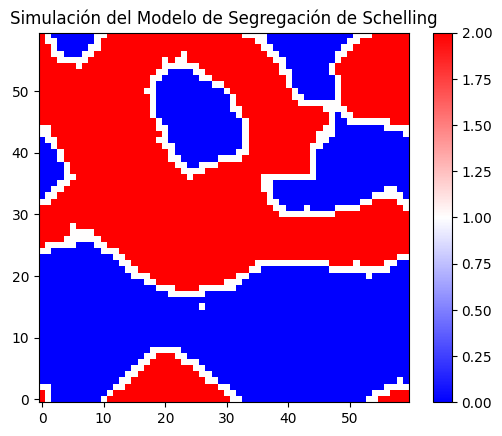

In [ ]:
animacion_similaridad(tau[0])

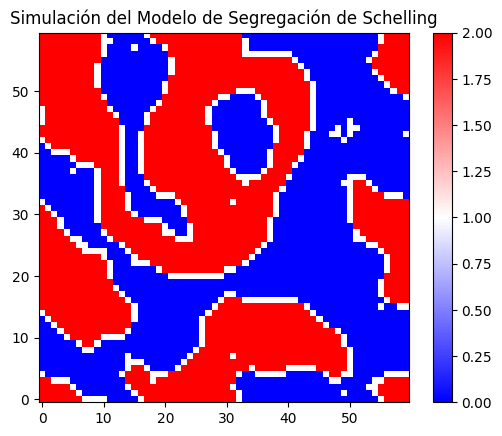

In [ ]:
animacion_similaridad(tau[1])

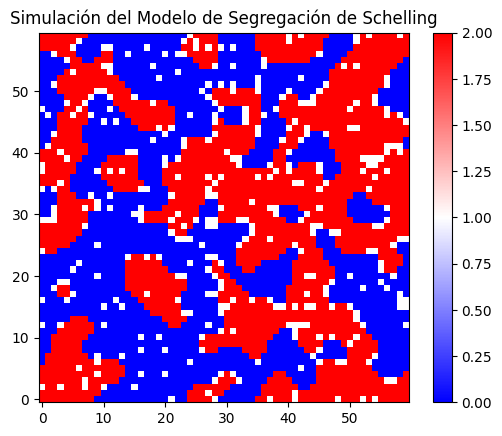

In [ ]:
animacion_similaridad(tau[2])

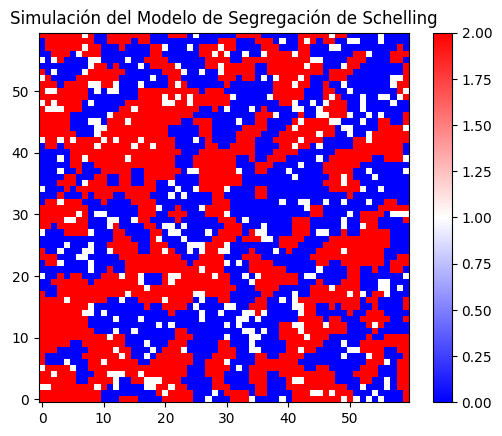

In [ ]:
animacion_similaridad(tau[3])

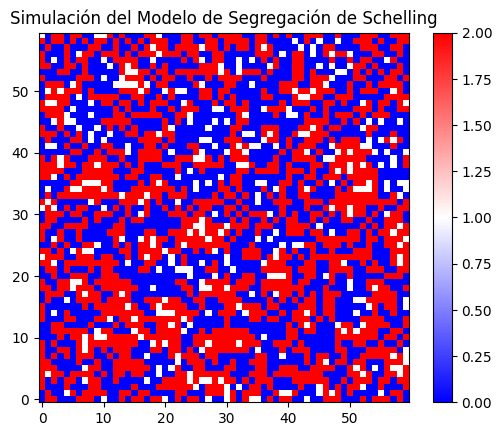

In [ ]:
animacion_similaridad(tau[4])

## Ejercicio 3

Considere una caminata aleatoria en 1 dimensión en la que el *random walker* puede moverse a derecha o a izquierda una unidad con igual probabilidad, iniciando desde el punto $x=0$. Considere $N_w = 1000$ caminantes aleatorios durante 1000 iteraciones. Para cada caminante almacene la posicion del caminante respecto al origen cada 100 unidades de tiempo, es decir para $t = 100, \, 200, \, 300, \, ... \, 1000$.

1. Muestre la distribución de la posición de los caminantes en cada uno de los 10 instrantes de tiempo registrados.
2. Realice una gráfica de cómo cambia la varianza de la distribución en función del tiempo.
3. Haga un ajuste lineal de la gráfica. Cuál es el valor de la pendiente?

*Pista: Inicialice una matriz de $N_w \times 10$ para almacenar la información de donde se encuentra cada caminante en cada tiempo requerido y luego calcule las distribuciones a lo largo de cada columna.*

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros del problema
N_w = 1000  # Número de caminantes
T = 1000    # Número de iteraciones
pasos_tiempo = np.arange(100, T+1, 100)  # Tiempos a registrar
posiciones = np.zeros((N_w,10))

# Simulación de la caminata aleatoria
for i in range(N_w):
    posicion = 0  # Cada caminante inicia en x=0
    for t in range(1, T+1):
        movimiento = np.random.choice([-1, 1])
        posicion += movimiento
        if t % 100 == 0:
            posiciones[i, t // 100 - 1] = posicion

In [ ]:
posiciones.shape

(1000, 10)

# 1. Mostrar la distribución de la posición de los caminantes en cada instante de tiemp

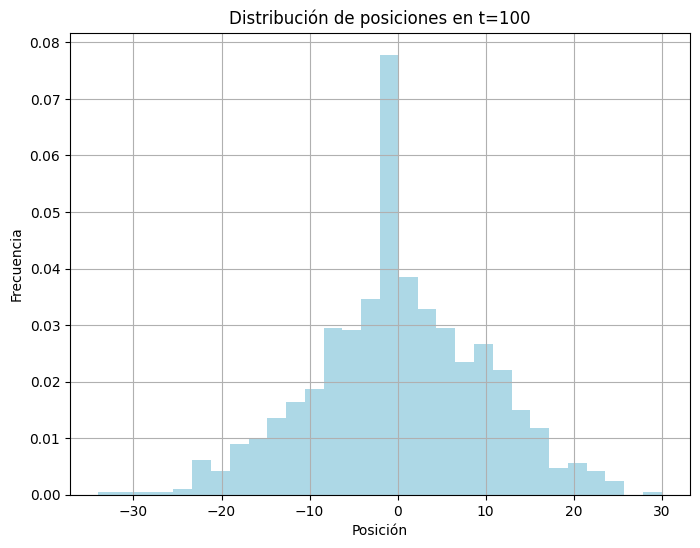

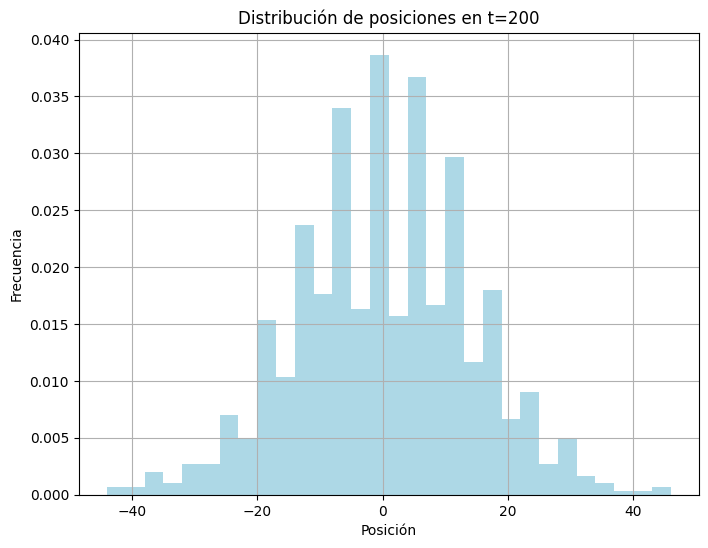

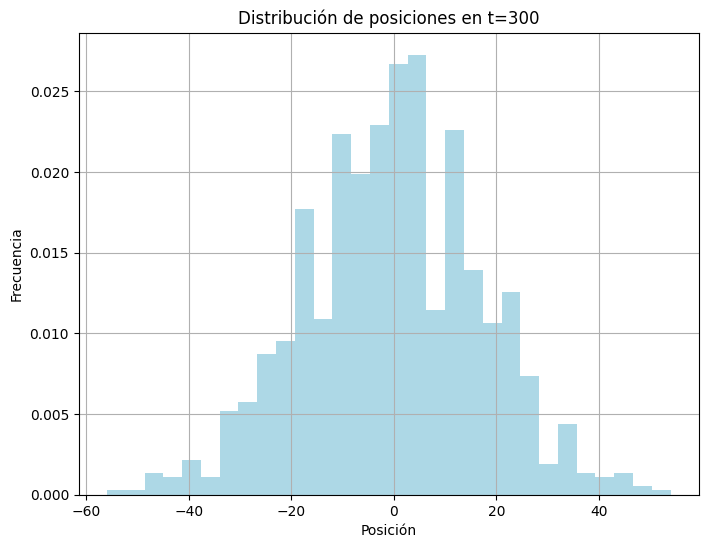

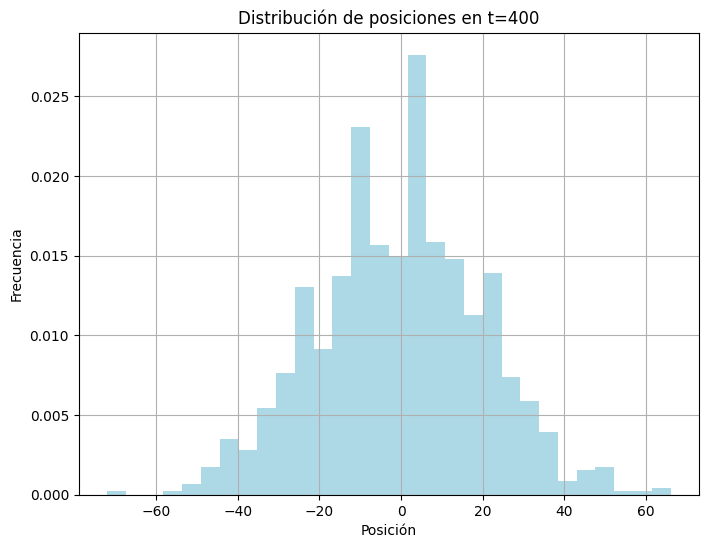

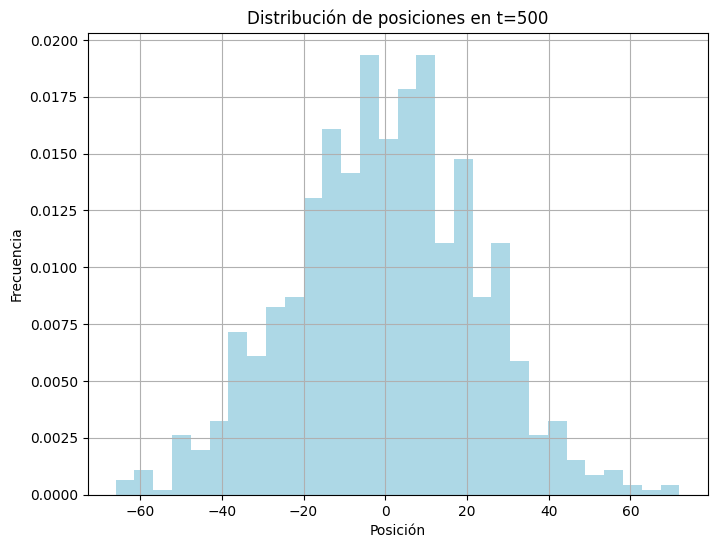

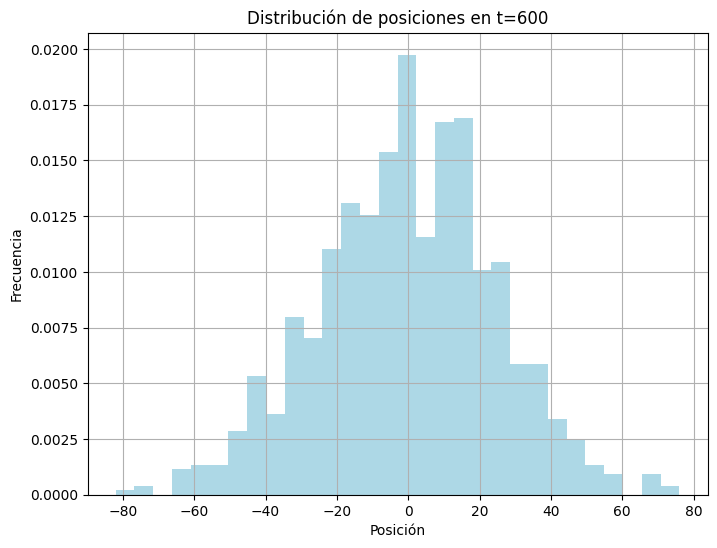

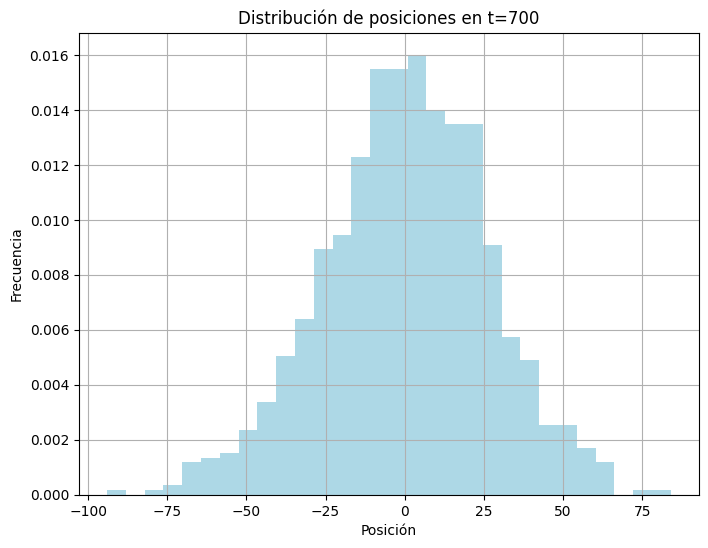

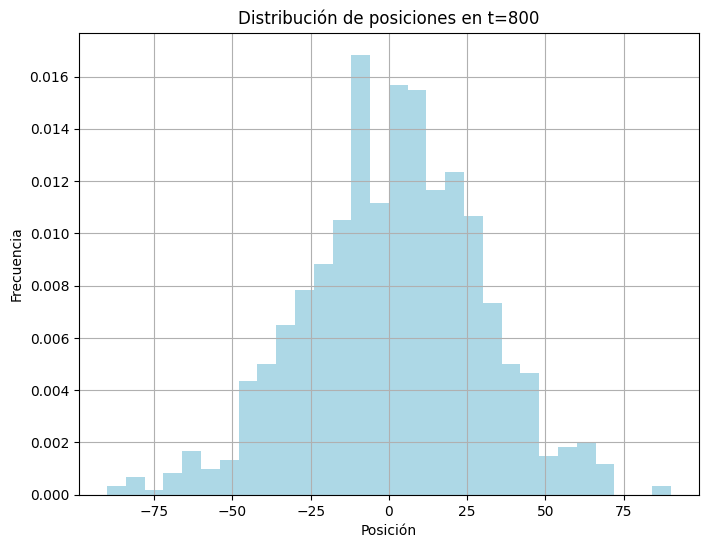

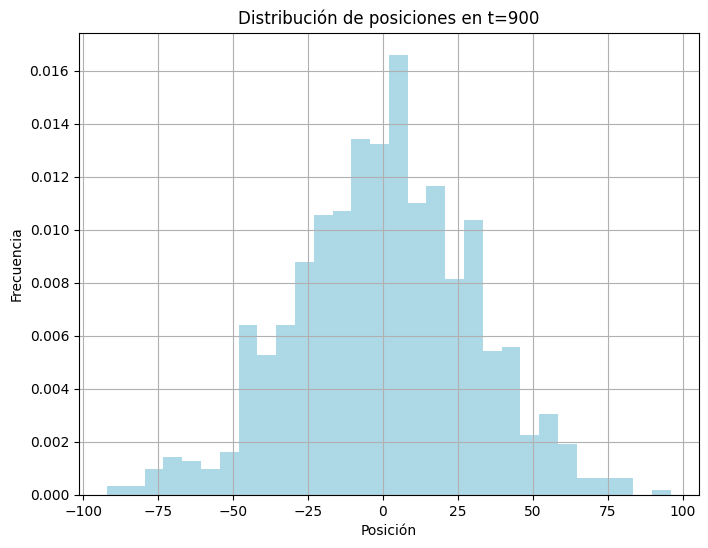

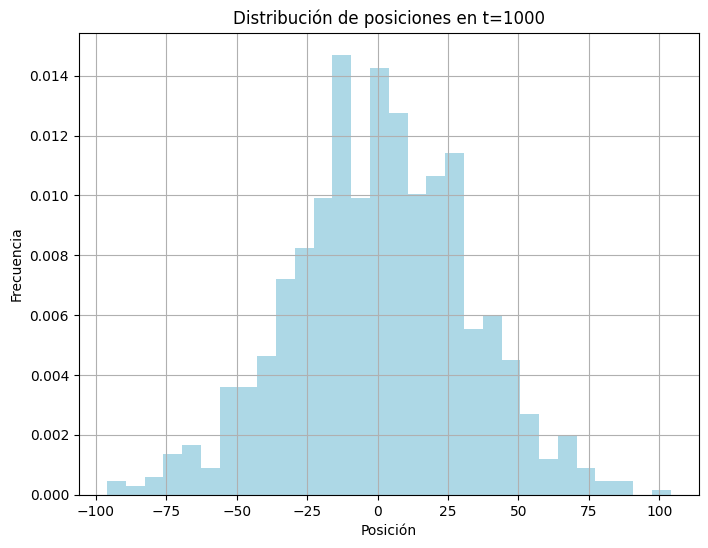

In [ ]:
for idx, t in enumerate(pasos_tiempo):
    plt.figure(figsize=(8, 6))
    plt.hist(posiciones[:, idx], bins=30, density=True, alpha=1, color='lightblue')
    plt.title(f"Distribución de posiciones en t={t}")
    plt.xlabel("Posición")
    plt.ylabel("Frecuencia")
    plt.grid(True)
    plt.show()

# 2. Calcular y graficar la varianza de la distribución en función del tiempo

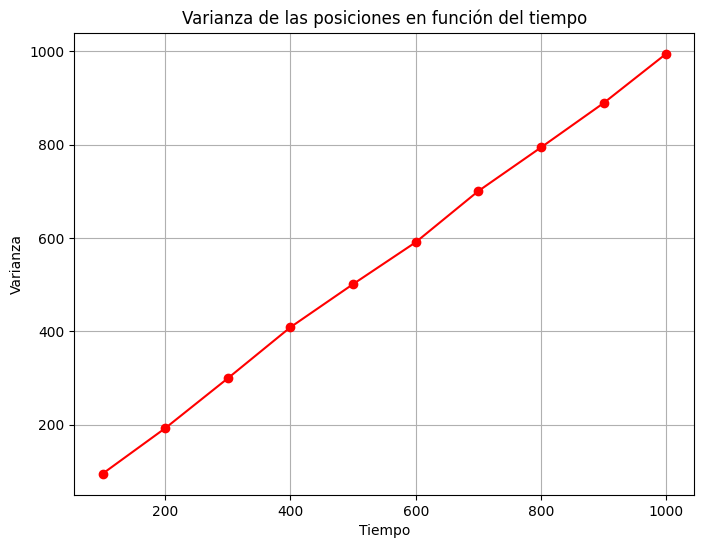

In [ ]:
varianzas = np.var(posiciones, axis=0)
plt.figure(figsize=(8, 6))
plt.plot(pasos_tiempo, varianzas, marker='o', linestyle='-', color='red')
plt.title("Varianza de las posiciones en función del tiempo")
plt.xlabel("Tiempo")
plt.ylabel("Varianza")
plt.grid(True)
plt.show()

# 3. Ajuste lineal de la varianza en función del tiempo

Pendiente del ajuste lineal: 0.9948


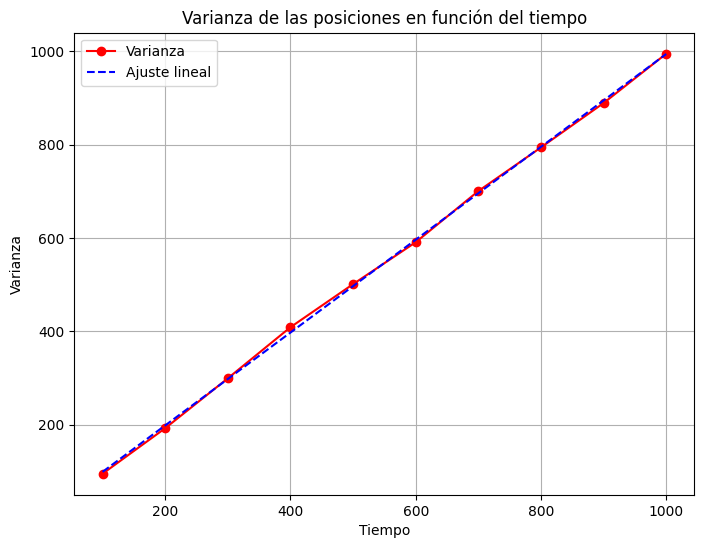

In [ ]:
from scipy.stats import linregress
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html
pendiente, intercepto, r, p_valor, std_err = linregress(pasos_tiempo, varianzas)
print(f"Pendiente del ajuste lineal: {pendiente:.4f}")

# Gráfica con el ajuste lineal
plt.figure(figsize=(8, 6))
plt.plot(pasos_tiempo, varianzas, marker='o', linestyle='-', color='red', label='Varianza')
plt.plot(pasos_tiempo, intercepto + pendiente * pasos_tiempo, linestyle='--', color='blue', label='Ajuste lineal')
plt.title("Varianza de las posiciones en función del tiempo")
plt.xlabel("Tiempo")
plt.ylabel("Varianza")
plt.legend()
plt.grid(True)
plt.show()


## Ejercicio 4

Simule un autótmata celular elemental de acuerdo a la regla de transición 110 según la numeración canónica de Wolfram, que establece la transición de acuerdo a la siguiente tabla:\
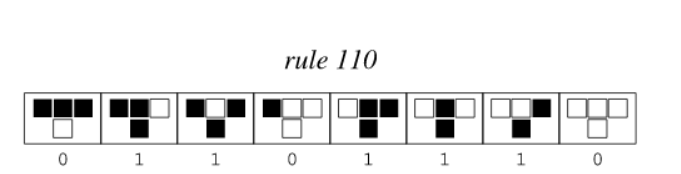


Para ello use una configuración inicial de 40 celdas inicializadas aleatoriamente como 0 o 1 con igual probabilidad. Use condiciones de frontera peródicas. Simule a lo largo de 100 iteraciones. Su resultado debe ser una matriz de $100 \times 40$ en la que las filas representan el tiempo transcurrido y las columnas las diferentes celdas.

https://wpmedia.wolfram.com/sites/13/2018/02/15-1-1.pdf. \
En general, el autómata celular conocido como $Regla 110$ según el esquema de numeración de Wolfram. Es un autómata celular unidimensional, consiste en una fila infinitamente larga de celdas {$C_i$ / $i \in \mathbb{Z}$}. Cada celda está en uno de los dos estados \{0, 1\} , y en cada paso de tiempo discreto, cada celda se actualiza sincrónicamente de acuerdo con el valor de sí misma y sus vecinos más cercanos: $\forall i$  $C_i' = F(C_{i-1}, C_i, C_{i+1})$, donde $F$ es la siguiente función:

$F(a, b, c) = \begin{cases}
0 & \text{si } (a, b, c) = (1, 1, 1) \\
1 & \text{si } (a, b, c) = (1, 1, 0) \\
1 & \text{si } (a, b, c) = (1, 0, 1) \\
0 & \text{si } (a, b, c) = (1, 0, 0) \\
1 & \text{si } (a, b, c) = (0, 1, 1) \\
1 & \text{si } (a, b, c) = (0, 1, 0) \\
1 & \text{si } (a, b, c) = (0, 0, 1) \\
0 & \text{si } (a, b, c) = (0, 0, 0)
\end{cases}$


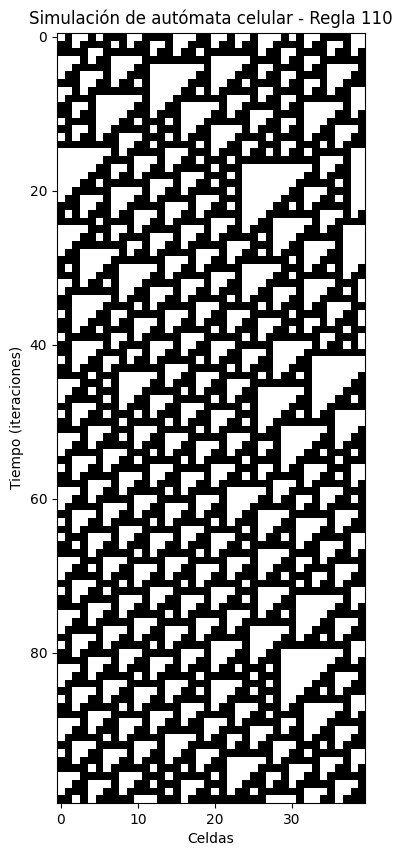

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

regla_110 = {
    (1, 1, 1): 0,
    (1, 1, 0): 1,
    (1, 0, 1): 1,
    (1, 0, 0): 0,
    (0, 1, 1): 1,
    (0, 1, 0): 1,
    (0, 0, 1): 1,
    (0, 0, 0): 0
}
n_celdas = 40
n_iteraciones = 100
celdas = np.random.choice([0, 1], size=n_celdas)
#lamacenar los estados de las celdas en el tiempo
estados_celdas = np.zeros((n_iteraciones, n_celdas), dtype=int)
estados_celdas[0, :] = celdas

def actualizar(celdas):
    nuevas_celdas = np.zeros_like(celdas)
    for i in range(n_celdas):
        # Condiciones periódicas de forntera
        izquierda = celdas[(i-1) % n_celdas]
        centro = celdas[i]
        derecha = celdas[(i+1) % n_celdas]
        nuevas_celdas[i] = regla_110[(izquierda, centro, derecha)]
    return nuevas_celdas

for t in range(1, n_iteraciones):
    celdas = actualizar(celdas)
    estados_celdas[t, :] = celdas


plt.figure(figsize=(10, 10))
plt.imshow(estados_celdas, cmap="binary", interpolation="nearest")
plt.title("Simulación de autómata celular - Regla 110")
plt.xlabel("Celdas")
plt.ylabel("Tiempo (iteraciones)")
plt.show()

## Ejercicio 5

Implemente el juego de la vida de Conway.

El **Juego de la Vida** de John Conway es un autómata celular que simula cómo una población de células en un mundo bidimensional evoluciona de acuerdo a reglas simples. Estas reglas determinan si una célula debe vivir, morir o nacer en la siguiente generación. El juego se basa en una rejilla donde cada célula puede estar viva o muerta, y cada célula interactúa con sus ocho vecinos adyacentes (arriba, abajo, izquierda, derecha y diagonales).

Las reglas son las siguientes:

1.
   Una célula viva con **2 o 3 vecinos vivos** permanece viva en la siguiente generación.

2.  
   Una célula viva con **menos de 2 vecinos vivos** muere en la siguiente generación por falta de interacción social (soledad).

3.
   Una célula viva con **más de 3 vecinos vivos** muere en la siguiente generación debido a la sobrepoblación.

4.  
   Una célula muerta con **exactamente 3 vecinos vivos** se convierte en una célula viva en la siguiente generación, como si naciera por reproducción.


In [ ]:
import numpy as np
import matplotlib.animation as animation
from matplotlib import rc
from IPython.display import HTML
import matplotlib.pyplot as plt
N = 100
# Inicializar la rejilla con valores 0 (muerto) y 1 (vivo)
Rejilla = np.random.choice([0, 1], size=(N, N))
# el estado del juego en cada paso temporal
def estado_celulas(frame):
    global Rejilla
    new_Rejilla = Rejilla.copy()
    for i in range(N):
        for j in range(N):
          #numero d evecinos adyacentes, en total 8
            Vecinos_Vivos = (Rejilla [i, (j-1)%N] + Rejilla [i, (j+1)%N] +
                     Rejilla [(i-1)%N, j] + Rejilla [(i+1)%N, j] +
                     Rejilla [(i-1)%N, (j-1)%N] + Rejilla [(i-1)%N, (j+1)%N] +
                     Rejilla [(i+1)%N, (j-1)%N] + Rejilla [(i+1)%N, (j+1)%N])
            # Una celula viva con menos de 2 vecinos muere
            if Rejilla [i, j] == 1 and (Vecinos_Vivos < 2 or Vecinos_Vivos > 3):
                new_Rejilla [i, j] = 0
            # Una celula viva con 2 o 3 vecinos vive
            elif Rejilla [i, j] == 1 and (Vecinos_Vivos == 2 or Vecinos_Vivos == 3):
                new_Rejilla [i, j] = 1
            # Una celula muerta con exactamente 3 vecinos vivos se convierte en una celula viva
            elif Rejilla [i, j] == 0 and Vecinos_Vivos == 3:
                new_Rejilla [i, j] = 1
    Rejilla = new_Rejilla.copy()
    img.set_array(Rejilla)
    return [img]


# Configurar la visualización
rc('animation', html='html5')
fig, ax = plt.subplots()

img = ax.imshow(Rejilla, cmap="binary")
ax.set_title("Juego de la Vida de Conway")


# Crear la animación
ani = animation.FuncAnimation(fig, estado_celulas, interval=100, blit=True, save_count=200)
plt.close()
ani